# Cross-Correlation and Waveform Morphology
---
#### Cross-correlate beamformed data

In [1]:
%%time
import glob, warnings, mcaap, sys, random, pywt, pickle, os
sys.path.append('/Users/mronacgiannone/Documents/Cardinal')
import cardinal
#-----------------------------------------------------------------------------------------------------------------#
# Command to make all plots interactive
%matplotlib ipympl

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from obspy import *
from obspy.core import *
from scipy import signal
from pyproj import Geod; g = Geod(ellps='sphere')
#-----------------------------------------------------------------------------------------------------------------#
# Ignore non-critical warnings
warnings.filterwarnings('ignore')
#-----------------------------------------------------------------------------------------------------------------#
# Load all data
database_dir = 'Databases/'
with open(database_dir+'MCA_dict.pkl', 'rb') as f:
    MCA_dict = pickle.load(f)
with open(database_dir+'MCB_dict.pkl', 'rb') as f:
    MCB_dict = pickle.load(f)
with open(database_dir+'EOCR_dict.pkl', 'rb') as f:
    EOCR_dict = pickle.load(f)
with open(database_dir+'EOCL_dict.pkl', 'rb') as f:
    EOCL_dict = pickle.load(f)
with open(database_dir+'WCT_dict.pkl', 'rb') as f:
    WCT_dict = pickle.load(f)
#-----------------------------------------------------------------------------------------------------------------#
# Global data directories
winter_data_dir = '/Volumes/Extreme SSD/McAAP/Winter_2021/'
summer_data_dir = '/Volumes/Extreme SSD/McAAP/Summer_2021/'

CPU times: user 8.38 s, sys: 7.48 s, total: 15.9 s
Wall time: 45.9 s


---
Assess spatial coherence (across array elements)

In [69]:
import re, numpy as np
from collections import defaultdict
from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

def compute_spatial_coherence(row_dict, array_prefix, fs, use_fisher=False):
    """
    Computes spatial coherence (mean max cross-correlation) per event.
    Assumes all traces are equal-length and time-aligned.
    Trims the first and last 5 seconds of each waveform.
    """
    import re, numpy as np
    from collections import defaultdict
    from datetime import datetime

    pat = re.compile(
        rf'^(?P<date>\d{{4}}-\d{{2}}-\d{{2}})_(?P<sta>{array_prefix}\d{{2}}[A-Za-z]*)_(?P<sig>\d+)$'
    )

    groups = defaultdict(dict)  # (date, sig) -> {station: waveform}
    trim_n = int(5 * fs)  # 5 seconds on each side

    for label, x in row_dict.items():
        m = pat.match(label)
        if m:
            date = m.group('date')
            sta  = m.group('sta')
            sig  = int(m.group('sig'))
            x = np.asarray(x, float).ravel()

            # --- trim first and last 5 seconds ---
            if len(x) > 2 * trim_n:
                x = x[trim_n:-trim_n]
            else:
                continue  # skip if too short after trimming

            groups[(date, sig)][sta] = x

    def fisher_mean(vals):
        v = np.clip(np.asarray(vals, float), -0.999999, 0.999999)
        return float(np.tanh(np.arctanh(v).mean()))

    results = []
    for (date, sig), stmap in sorted(groups.items()):
        stas = sorted(stmap.keys())
        if len(stas) < 2:
            continue
        pair_vals = []
        for i in range(len(stas)):
            for j in range(i+1, len(stas)):
                a, b = stmap[stas[i]], stmap[stas[j]]
                t_data = np.arange(len(a)) / fs
                lags, x_corr = mcaap.norm_xcorr_temporal(t_data, a, b)
                pair_vals.append(np.max(x_corr))  # your coherence definition
        coh_event = fisher_mean(pair_vals) if use_fisher else float(np.mean(pair_vals))
        results.append({
            "date": datetime.fromisoformat(date),
            "sig": sig,
            "coh_event": coh_event
        })
    return results

In [100]:
def plot_event_coherence(results, title=None, start_date=None, end_date=None, debug=False):
    import matplotlib.pyplot as plt
    import matplotlib.dates as mdates
    import numpy as np
    from datetime import datetime, date, time

    def _to_datetime(dt_like):
        if isinstance(dt_like, datetime):
            return dt_like
        if isinstance(dt_like, date):
            return datetime.combine(dt_like, time())
        if isinstance(dt_like, np.datetime64):
            return datetime.utcfromtimestamp(
                (dt_like - np.datetime64("1970-01-01T00:00:00Z")) / np.timedelta64(1, "s")
            )
        if isinstance(dt_like, str):
            return datetime.fromisoformat(dt_like.replace("Z", "").strip())
        return datetime.fromisoformat(str(dt_like).replace("Z", "").strip())

    # Normalize and sort
    dates = np.array([_to_datetime(r["date"]) for r in results])
    vals  = np.array([r["coh_event"] for r in results], dtype=float)
    order = np.argsort(dates)
    dates, vals = dates[order], vals[order]

    if debug and len(dates) > 0:
        print(f"[plot_event_coherence] range: {dates[0]:%Y-%m-%d} → {dates[-1]:%Y-%m-%d}")

    fig, ax = plt.subplots(figsize=(11, 3.2))
    ax.scatter(dates, vals, s=12, alpha=0.7)
    ax.set_ylim(0, 1)
    ax.set_ylabel("Normalized Correlation Coefficient")
    ax.set_xlabel("Date")
    if title:
        ax.set_title(title)

    # Weekly ticks (Mondays) and gridlines
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=mdates.MO, interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    ax.grid(True, which='major', axis='x', linestyle=':', color='gray', alpha=0.5)
    ax.grid(True, which='major', axis='y', linestyle=':', color='gray', alpha=0.5)

    # Visible date range
    xlim = [None, None]
    if start_date is not None:
        xlim[0] = _to_datetime(start_date)
        if debug:
            print(f"[plot_event_coherence] x-axis starts at {xlim[0]:%Y-%m-%d}")
    if end_date is not None:
        xlim[1] = _to_datetime(end_date)
        if debug:
            print(f"[plot_event_coherence] x-axis ends at {xlim[1]:%Y-%m-%d}")
    if any(xlim):
        ax.set_xlim(xlim)

    plt.tight_layout()
    return fig, ax

In [228]:
def plot_daily_coherence(results, title=None, start_date=None, end_date=None, show_global='median', outpath=None):
    """
    Box-and-whisker plot of spatial coherence per day.
    Optional start_date and end_date set the visible x-axis range.
    Adds a horizontal dashed line showing the global median or mean across daily medians.
    
    Parameters
    ----------
    results : list of dicts
        Each with keys "date" (datetime) and "coh_event" (float)
    title : str, optional
        Plot title
    start_date, end_date : str | datetime | date | np.datetime64, optional
        Visible range for the x-axis
    show_global : {'median', 'mean'}, default='median'
        Whether to display the global median or mean of daily medians as the dashed line
    """
    import matplotlib.pyplot as plt
    import matplotlib.dates as mdates
    import numpy as np
    from collections import defaultdict
    from datetime import datetime, date, time

    def _to_datetime(dt_like):
        if isinstance(dt_like, datetime):
            return dt_like
        if isinstance(dt_like, date):
            return datetime.combine(dt_like, time())
        if isinstance(dt_like, np.datetime64):
            return datetime.utcfromtimestamp(
                (dt_like - np.datetime64("1970-01-01T00:00:00Z")) / np.timedelta64(1, "s")
            )
        if isinstance(dt_like, str):
            return datetime.fromisoformat(dt_like.replace("Z", "").strip())
        return datetime.fromisoformat(str(dt_like).replace("Z", "").strip())

    # --- group coherence by day ---
    by_day = defaultdict(list)
    for r in results:
        dt = _to_datetime(r["date"])
        by_day[dt.date()].append(float(r["coh_event"]))

    # sort days
    days_sorted = sorted(by_day.keys())
    day_vals = [by_day[d] for d in days_sorted]
    pos = mdates.date2num([datetime.combine(d, time()) for d in days_sorted])

    # --- create plot ---
    fig, ax = plt.subplots(figsize=(12, 4))
    bp = ax.boxplot(
        day_vals,
        positions=pos,
        widths=1.0,
        manage_ticks=False,
        showfliers=True,
        patch_artist=True,
        showmeans=False,                # <-- add this
        meanline=True,                 # optional, draws mean as a line instead of a dot
        meanprops=dict(color='red', linewidth=1),  # style for mean line
        flierprops=dict(
            marker='o',            # circular marker
            markerfacecolor='red', # <-- change color here
            markeredgecolor='black',
            markersize=7,
            alpha=0.5)
    )

    # style
    for box in bp['boxes']:
        box.set(facecolor='white', edgecolor='black', linewidth=1.0)
    for item in ['whiskers', 'caps', 'medians']:
        for line in bp[item]:
            line.set(color='black', linewidth=1.0)

    ax.set_ylim(0, 1)
    ax.set_ylabel("Normalized Correlation Coefficient")
    ax.set_xlabel("Date")
    if title:
        ax.set_title(title)

    # weekly ticks and gridlines
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=mdates.MO, interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    ax.grid(True, which='major', axis='x', linestyle=':', color='gray', alpha=0.5)
    ax.grid(True, which='major', axis='y', linestyle=':', color='gray', alpha=0.5)

    # --- compute global median (or mean) of daily medians ---
    daily_medians = [np.median(vals) for vals in day_vals]
    global_val = np.median(daily_medians) if show_global == 'median' else np.mean(daily_medians)

    # add horizontal dashed line
    ax.axhline(global_val, color='tab:gray', linestyle='--', linewidth=1.2,
               label=f"Global {show_global}: {global_val:.2f}")
    ax.legend(frameon=False, loc='lower right')

    # visible date range
    xlim = [None, None]
    if start_date is not None:
        xlim[0] = _to_datetime(start_date)
    if end_date is not None:
        xlim[1] = _to_datetime(end_date)
    if any(xlim):
        ax.set_xlim(xlim)

    plt.tight_layout()
    if outpath is not None:
        fig.savefig(outpath, dpi=200, bbox_inches="tight")

    return fig, ax

---
Winter campaign 2021

(<Figure size 1200x400 with 1 Axes>,
 <Axes: title={'center': 'MCA - Spatial Coherence'}, xlabel='Date', ylabel='Normalized Correlation Coefficient'>)

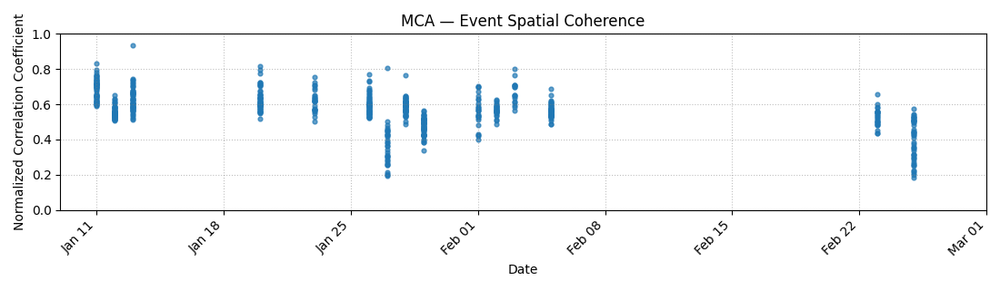

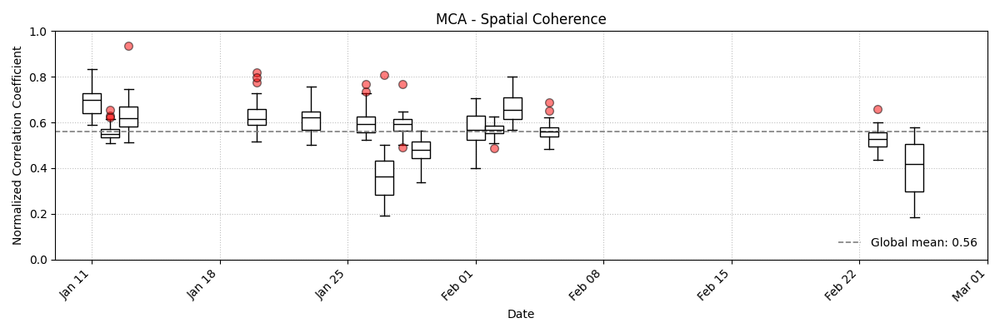

In [233]:
fs = 40.0  # Hz
results = compute_spatial_coherence(MCA_dict, array_prefix="MCA", fs=fs)

plot_event_coherence(results, title="MCA — Event Spatial Coherence", start_date="2021-01-09", end_date="2021-03-01")
plot_daily_coherence(results, title="MCA - Spatial Coherence", start_date="2021-01-09", end_date="2021-03-01", show_global='mean', outpath="Figures/Spatial_Coherence/MCA.png")

(<Figure size 1200x400 with 1 Axes>,
 <Axes: title={'center': 'EOCR - Spatial Coherence'}, xlabel='Date', ylabel='Normalized Correlation Coefficient'>)

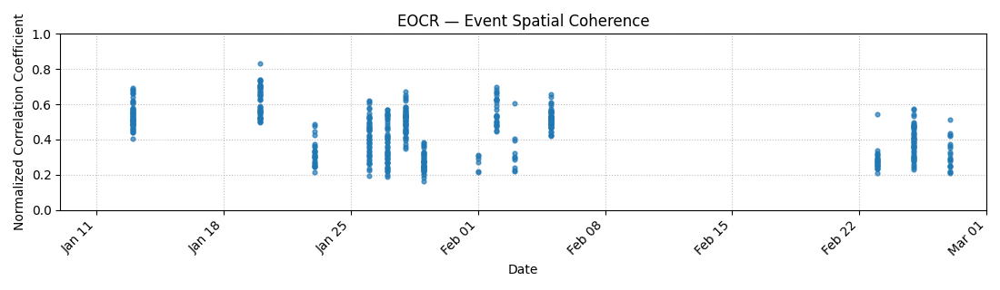

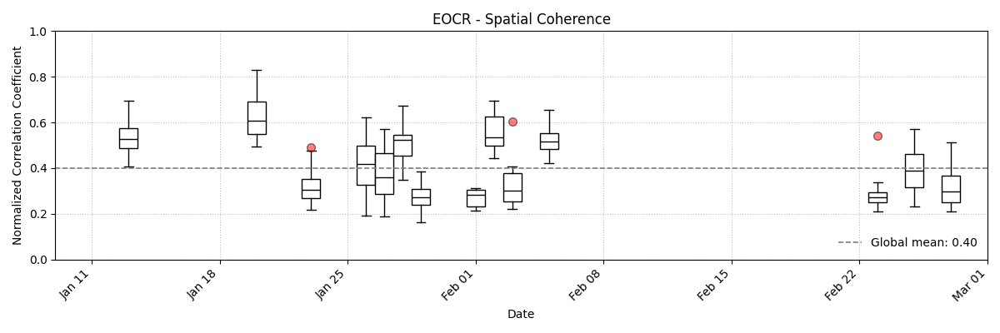

In [224]:
fs = 40.0  # Hz
results = compute_spatial_coherence(EOCR_dict, array_prefix="EOC", fs=fs)

plot_event_coherence(results, title="EOCR — Event Spatial Coherence", start_date="2021-01-09", end_date="2021-03-01")
plot_daily_coherence(results, title="EOCR - Spatial Coherence", start_date="2021-01-09", end_date="2021-03-01", show_global='mean')

(<Figure size 1200x400 with 1 Axes>,
 <Axes: title={'center': 'EOCL - Spatial Coherence'}, xlabel='Date', ylabel='Normalized Correlation Coefficient'>)

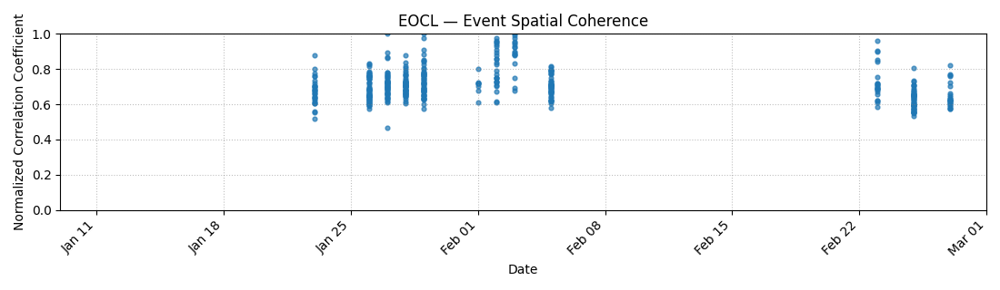

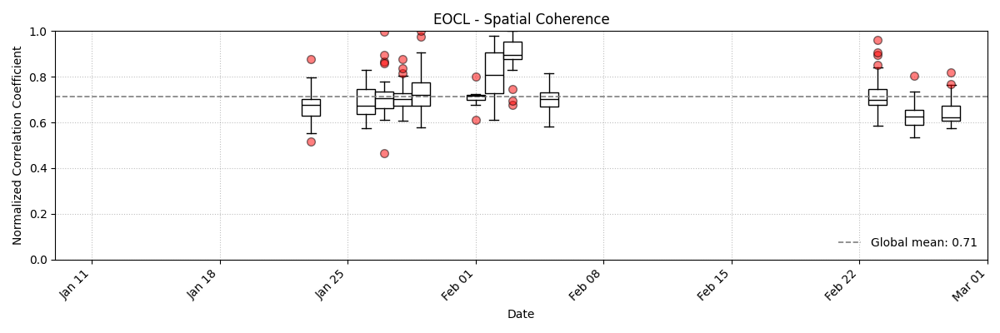

In [230]:
fs = 40.0  # Hz
results = compute_spatial_coherence(EOCL_dict, array_prefix="EOCL", fs=fs)

plot_event_coherence(results, title="EOCL — Event Spatial Coherence", start_date="2021-01-09", end_date="2021-03-01")
plot_daily_coherence(results, title="EOCL - Spatial Coherence", start_date="2021-01-09", end_date="2021-03-01", show_global='mean', outpath="Figures/Spatial_Coherence/EOCL.png")

---
Summer campaign 2021

(<Figure size 1200x400 with 1 Axes>,
 <Axes: title={'center': 'MCB - Spatial Coherence'}, xlabel='Date', ylabel='Normalized Correlation Coefficient'>)

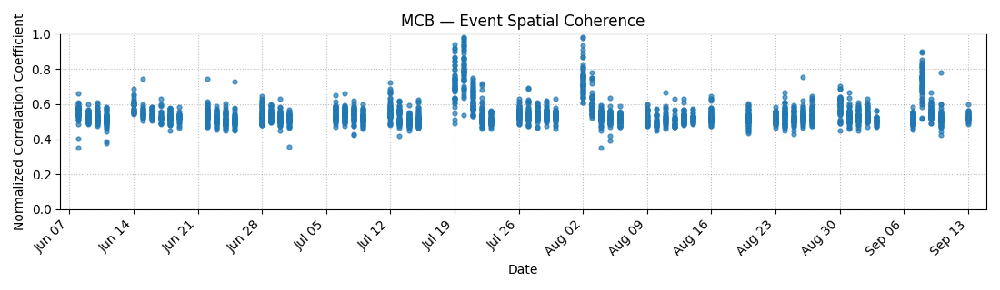

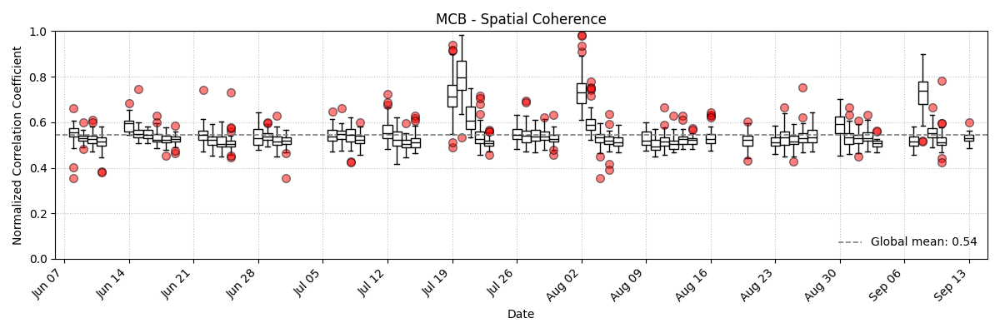

In [231]:
fs = 40.0  # Hz
results = compute_spatial_coherence(MCB_dict, array_prefix="MCB", fs=fs)

plot_event_coherence(results, title="MCB — Event Spatial Coherence", start_date="2021-06-06", end_date="2021-09-15")
plot_daily_coherence(results, title="MCB - Spatial Coherence", start_date="2021-06-06", end_date="2021-09-15", show_global='mean', outpath="Figures/Spatial_Coherence/MCB.png")

(<Figure size 1200x400 with 1 Axes>,
 <Axes: title={'center': 'WCT - Spatial Coherence'}, xlabel='Date', ylabel='Normalized Correlation Coefficient'>)

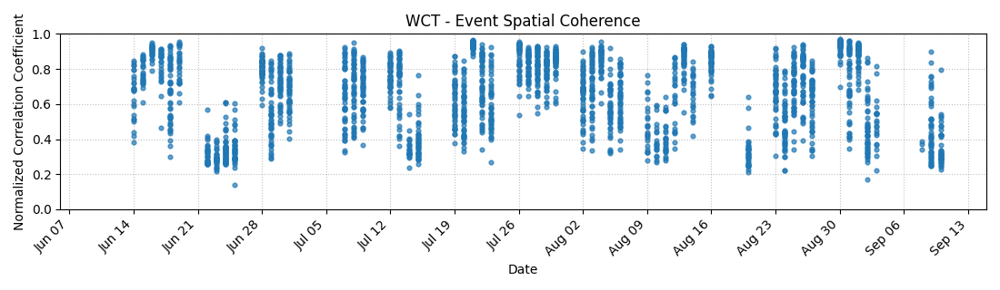

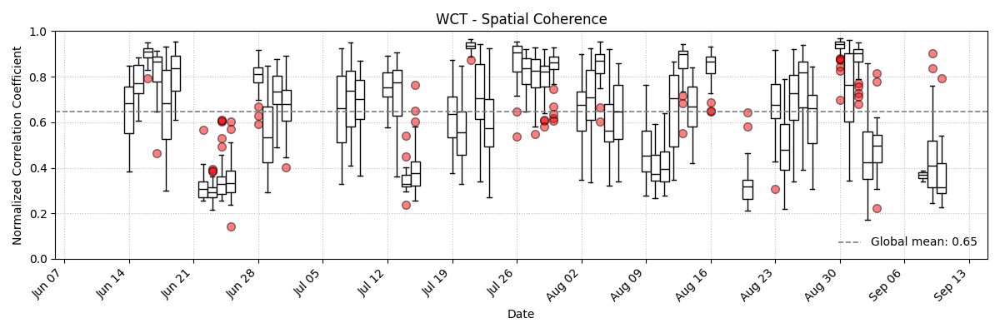

In [232]:
fs = 40.0  # Hz
results = compute_spatial_coherence(WCT_dict, array_prefix="WCT", fs=fs)

plot_event_coherence(results, title="WCT - Event Spatial Coherence", start_date="2021-06-06", end_date="2021-09-15")
plot_daily_coherence(results, title="WCT - Spatial Coherence", start_date="2021-06-06", end_date="2021-09-15", show_global='mean', outpath="Figures/Spatial_Coherence/WCT.png")

---
Assess temporal coherence (across events)

In [108]:
import re

def get_day_element_data(data_dict, date_str, array_prefix, element_num):
    """
    Extracts all signals for a given date and array element.
    
    Parameters
    ----------
    data_dict : dict
        Dictionary of {label: waveform_array}
    date_str : str
        Date in 'YYYY-MM-DD' format
    array_prefix : str
        Array name, e.g. 'MCA', 'EOCL'
    element_num : int or str
        Element number (e.g. 1 for 'MCA01')
    
    Returns
    -------
    dict
        Dictionary of {label: waveform_array} for that date and element.
    """
    # Format the element with two digits, e.g. 1 -> '01'
    element_id = f"{array_prefix}{int(element_num):02d}"
    
    # Pattern for this date and element (e.g. '2021-01-11_MCA01_')
    pattern = re.compile(rf"^{date_str}_{element_id}_\d+$")
    
    # Filter dictionary
    subset = {label: data for label, data in data_dict.items() if pattern.match(label)}
    
    return subset


In [134]:
# Get all signals for Jan 11, 2021 from element 1 at array MCA
subset = get_day_element_data(MCA_dict, "2021-01-28", "MCA", 1)

print(f"Found {len(subset)} signals:")
for k in subset.keys():
    print(" ", k)

Found 52 signals:
  2021-01-28_MCA01_1
  2021-01-28_MCA01_2
  2021-01-28_MCA01_3
  2021-01-28_MCA01_4
  2021-01-28_MCA01_5
  2021-01-28_MCA01_6
  2021-01-28_MCA01_7
  2021-01-28_MCA01_8
  2021-01-28_MCA01_9
  2021-01-28_MCA01_10
  2021-01-28_MCA01_11
  2021-01-28_MCA01_12
  2021-01-28_MCA01_13
  2021-01-28_MCA01_14
  2021-01-28_MCA01_15
  2021-01-28_MCA01_16
  2021-01-28_MCA01_17
  2021-01-28_MCA01_18
  2021-01-28_MCA01_19
  2021-01-28_MCA01_20
  2021-01-28_MCA01_21
  2021-01-28_MCA01_22
  2021-01-28_MCA01_23
  2021-01-28_MCA01_24
  2021-01-28_MCA01_25
  2021-01-28_MCA01_26
  2021-01-28_MCA01_27
  2021-01-28_MCA01_28
  2021-01-28_MCA01_29
  2021-01-28_MCA01_30
  2021-01-28_MCA01_31
  2021-01-28_MCA01_32
  2021-01-28_MCA01_33
  2021-01-28_MCA01_34
  2021-01-28_MCA01_35
  2021-01-28_MCA01_36
  2021-01-28_MCA01_37
  2021-01-28_MCA01_38
  2021-01-28_MCA01_39
  2021-01-28_MCA01_40
  2021-01-28_MCA01_41
  2021-01-28_MCA01_42
  2021-01-28_MCA01_43
  2021-01-28_MCA01_44
  2021-01-28_MCA01_45
 

Shape of array: (52, 800)


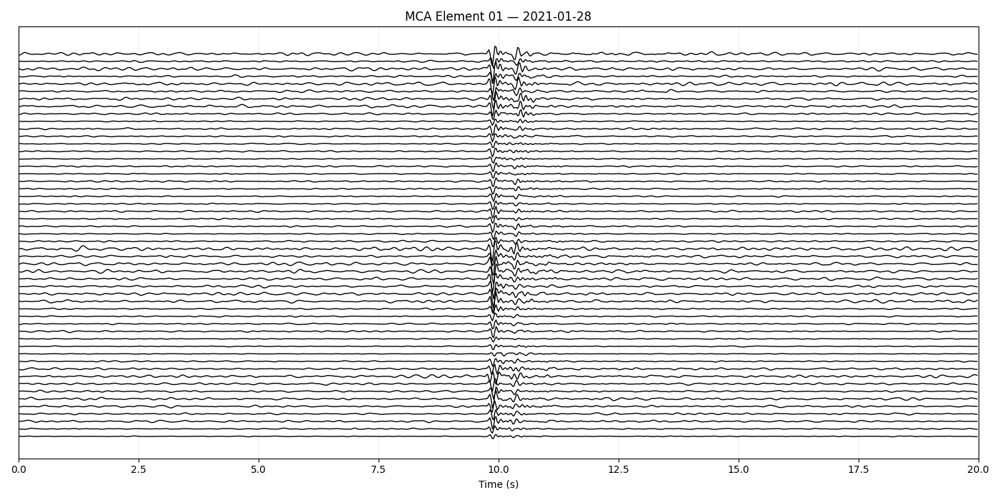

In [136]:
# Parameters
fs = 40.0   # <-- replace with your actual sampling rate (Hz)
trim_s = 5  # seconds to trim from start and end
trim_n = int(trim_s * fs)

# Create a new figure and axis handle
fig, ax = plt.subplots(figsize=(14, 7))

data_tmp = []
k = 0
for label, waveform in subset.items():
    waveform = np.asarray(waveform).ravel()
    # --- Trim first and last 5 seconds ---
    waveform = waveform[trim_n:-trim_n]

    # --- Create time axis in seconds ---
    t = np.arange(len(waveform)) / fs

    # --- Plot vertically offset waveform ---
    ax.plot(t, waveform + k, lw=1, color='k')
    k += 1.1
    data_tmp.append(waveform)

data_tmp = np.array(data_tmp)
print("Shape of array:", data_tmp.shape)

# Label and style
ax.set_title("MCA Element 01 — 2021-01-28")
ax.set_xlabel("Time (s)")
ax.grid(True, ls=":", alpha=0.5); plt.xlim([0,20]); plt.yticks([])

plt.tight_layout()
plt.show()


In [137]:
%%time
# Cross-correlate
xcorr_coef, lag_tshifts, ref = mcaap.xcorr_matrix_temporal(t, data_tmp)

CPU times: user 1.47 s, sys: 20.7 ms, total: 1.49 s
Wall time: 1.48 s


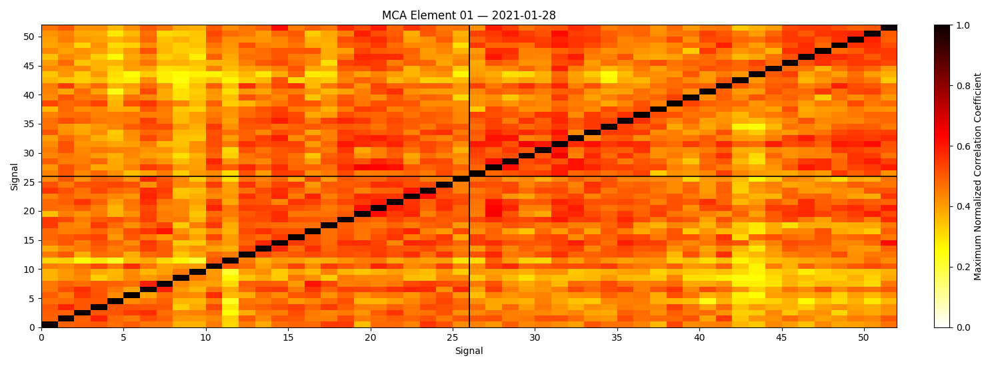

In [155]:
fig, ax = plt.subplots(figsize=(15, 5.5))

# Create coordinate grid edges so pcolormesh aligns with matrix cells
n = xcorr_coef.shape[0]
x = np.arange(n + 1)
y = np.arange(n + 1)

# Plot with pcolormesh
c = ax.pcolormesh(x, y, xcorr_coef, cmap='hot_r', vmin=0, vmax=1, shading='auto')

# Add colorbar
cbar = plt.colorbar(c, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label("Maximum Normalized Correlation Coefficient")

# Titles and labels
ax.set_title('MCA Element 01 — 2021-01-28', fontsize=12)
ax.set_xlabel("Signal")
ax.set_ylabel("Signal")

# Ticks every 5 signals (optional)
ticks = np.arange(0, n + 1, 5)
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_xticklabels(ticks)
ax.set_yticklabels(ticks)

# Add gridline separating the two regions (Area 2 and Area 1)
split_idx = 26
ax.axvline(split_idx, color='black', lw=1.2)
ax.axhline(split_idx, color='black', lw=1.2)

plt.tight_layout()
plt.show()

In [275]:
import re, numpy as np, matplotlib.pyplot as plt
from pathlib import Path

# --------------------------------------------------------------------------------------

def group_by_date_for_element(data_dict, array_prefix, element_num):
    """
    Return dict: { 'YYYY-MM-DD': [waveform1, waveform2, ...] } for a single array element.
    Labels look like: YYYY-MM-DD_<ARRAY><EL>_<sig>
    """
    el_tag = f"{array_prefix}{int(element_num):02d}"
    pat = re.compile(rf'^(?P<date>\d{{4}}-\d{{2}}-\d{{2}})_{el_tag}_(?P<sig>\d+)$')
    by_day = {}
    for label, wf in data_dict.items():
        m = pat.match(label)
        if not m:
            continue
        d = m.group("date")
        by_day.setdefault(d, []).append(np.asarray(wf, float).ravel())
    return by_day

def plot_waveform_stack(lag_tshifts, ref, day, array_prefix, element_num, waveforms, fs, outdir, trace_spacing=1.25, xlim=[0,20]):
    """Save vertically offset waveform stack (trimmed, time axis in seconds)."""
    fig, ax = plt.subplots(figsize=(14, 7))
    k = 0.0
    kept = 0
    for i, wf in enumerate(waveforms):
        if len(wf) <= 2*trim_n:
            continue
        wf = wf[trim_n:-trim_n]
        t  = np.arange(len(wf)) / fs
        ax.plot(t + lag_tshifts[ref[0],i], wf + k, lw=1, color='k')
        k += trace_spacing
        kept += 1
    ax.set_title(f"{array_prefix}{element_num:02d} — {day}")
    ax.set_xlabel("Time (s)"); plt.xlim(xlim)
    ax.set_yticks([])
    ax.grid(True, ls=":", alpha=0.5)
    plt.tight_layout()
    outpath = outdir / f"{array_prefix}{element_num:02d}_{day}_waveforms.png"
    fig.savefig(outpath, dpi=200, bbox_inches="tight")
    plt.close(fig)
    return kept

def plot_corr_matrix_pmesh(corr_matrix, title, outpath, split_idx=None):
    """Save correlation matrix using pcolormesh (0-1 scale)."""
    fig, ax = plt.subplots(figsize=(18, 7))
    n = corr_matrix.shape[0]
    x = np.arange(n+1); y = np.arange(n+1)
    pm = ax.pcolormesh(x, y, corr_matrix, cmap="hot_r", vmin=0, vmax=1, shading="auto")
    cbar = plt.colorbar(pm, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label("Normalized Correlation Coefficient")
    ax.set_title(title)
    ax.set_xlabel("Signal"); ax.set_ylabel("Signal")
    step = max(1, n//10)
    ticks = np.arange(0, n+1, step)
    ax.set_xticks(ticks); ax.set_yticks(ticks)
    ax.set_xticklabels(ticks); ax.set_yticklabels(ticks)

    # Optional divider between two groups (e.g., first 26 vs next 26)
    if split_idx is not None and 0 < split_idx < n:
        ax.axvline(split_idx, color='black', lw=1.2)
        ax.axhline(split_idx, color='black', lw=1.2)

    plt.tight_layout()
    fig.savefig(outpath, dpi=200, bbox_inches="tight")
    plt.close(fig)

In [276]:
%%time
# --------------------------------------------------------------------------------------
# CONFIG
fs = 40.0                 # sampling rate (Hz)
trim_s = 5                # seconds to trim at both ends
trim_n = int(fs * trim_s)

save_dir = Path("Waveforms/MCA")
save_dir.mkdir(exist_ok=True)

save_dir_xcorr = Path("Cross_Corr/MCA")
save_dir_xcorr.mkdir(exist_ok=True)

array_prefix = "MCA"      # e.g., "MCA", "EOCL", "EOCR"
element_num  = 4          # e.g., 1 for "MCA01"

# --------------------------------------------------------------------------------------
# MAIN
# Example: MCA_dict is your dict of {'YYYY-MM-DD_MCA01_1': waveform, ...}
# Replace MCA_dict below with your actual dictionary variable.
by_day = group_by_date_for_element(MCA_dict, array_prefix, element_num)

for day, wfs in sorted(by_day.items()):
    if len(wfs) < 2:
        continue
        
    # Build equal-length stack for xcorr_matrix_temporal
    # Trim 5s, then truncate all to the minimum remaining length
    trimmed = [wf[trim_n:-trim_n] for wf in wfs if len(wf) > 2*trim_n]
    L = min(len(wf) for wf in trimmed)
    data_tmp = np.stack([wf[:L] for wf in trimmed], axis=0)  # shape (N, L)
    t = np.arange(L) / fs                                   # shape (L,)
        
    # Compute correlation matrix with YOUR function
    xcorr_coef, lag_tshifts, ref = mcaap.xcorr_matrix_temporal(t, data_tmp)
    
    # Save waveform stack figure
    n_kept = plot_waveform_stack(lag_tshifts, ref, day, array_prefix, element_num, wfs, fs, save_dir)
    if n_kept < 2:
        # Not enough valid traces after trimming
        continue

    # Save correlation-matrix figure
    title = f"{array_prefix}{element_num:02d} — {day}"
    outpath = save_dir_xcorr / f"{array_prefix}{element_num:02d}_{day}_corr_matrix.png"
    # If you want the Area2/Area1 divider, set split_idx=26 (or None to skip)
    plot_corr_matrix_pmesh(xcorr_coef, title, outpath, split_idx=26)

CPU times: user 32.2 s, sys: 457 ms, total: 32.6 s
Wall time: 19.3 s


In [277]:
%%time
# --------------------------------------------------------------------------------------
# CONFIG
fs = 40.0                 # sampling rate (Hz)
trim_s = 5                # seconds to trim at both ends
trim_n = int(fs * trim_s)

save_dir = Path("Waveforms/EOCL")
save_dir.mkdir(exist_ok=True)

save_dir_xcorr = Path("Cross_Corr/EOCL")
save_dir_xcorr.mkdir(exist_ok=True)

array_prefix = "EOCL"      # e.g., "MCA", "EOCL", "EOCR"
element_num  = 7          # e.g., 1 for "MCA01"

# --------------------------------------------------------------------------------------
# MAIN
# Example: MCA_dict is your dict of {'YYYY-MM-DD_MCA01_1': waveform, ...}
# Replace MCA_dict below with your actual dictionary variable.
by_day = group_by_date_for_element(EOCL_dict, array_prefix, element_num)

for day, wfs in sorted(by_day.items()):
    if len(wfs) < 2:
        continue
        
    # Build equal-length stack for xcorr_matrix_temporal
    # Trim 5s, then truncate all to the minimum remaining length
    trimmed = [wf[trim_n:-trim_n] for wf in wfs if len(wf) > 2*trim_n]
    L = min(len(wf) for wf in trimmed)
    data_tmp = np.stack([wf[:L] for wf in trimmed], axis=0)  # shape (N, L)
    t = np.arange(L) / fs                                   # shape (L,)
        
    # Compute correlation matrix with YOUR function
    xcorr_coef, lag_tshifts, ref = mcaap.xcorr_matrix_temporal(t, data_tmp)
    
    # Save waveform stack figure
    n_kept = plot_waveform_stack(lag_tshifts, ref, day, array_prefix, element_num, wfs, fs, save_dir)
    if n_kept < 2:
        # Not enough valid traces after trimming
        continue

    # Save correlation-matrix figure
    title = f"{array_prefix}{element_num:02d} — {day}"
    outpath = save_dir_xcorr / f"{array_prefix}{element_num:02d}_{day}_corr_matrix.png"
    # If you want the Area2/Area1 divider, set split_idx=26 (or None to skip)
    plot_corr_matrix_pmesh(xcorr_coef, title, outpath, split_idx=26)

CPU times: user 23.9 s, sys: 332 ms, total: 24.2 s
Wall time: 13.6 s


In [278]:
%%time
# --------------------------------------------------------------------------------------
# CONFIG
fs = 40.0                 # sampling rate (Hz)
trim_s = 5                # seconds to trim at both ends
trim_n = int(fs * trim_s)

save_dir = Path("Waveforms/MCB")
save_dir.mkdir(exist_ok=True)

save_dir_xcorr = Path("Cross_Corr/MCB")
save_dir_xcorr.mkdir(exist_ok=True)

array_prefix = "MCB"      # e.g., "MCA", "EOCL", "EOCR"
element_num  = 1          # e.g., 1 for "MCA01"

# --------------------------------------------------------------------------------------
# MAIN
# Example: MCA_dict is your dict of {'YYYY-MM-DD_MCA01_1': waveform, ...}
# Replace MCA_dict below with your actual dictionary variable.
by_day = group_by_date_for_element(MCB_dict, array_prefix, element_num)

for day, wfs in sorted(by_day.items()):
    if len(wfs) < 2:
        continue
        
    # Build equal-length stack for xcorr_matrix_temporal
    # Trim 5s, then truncate all to the minimum remaining length
    trimmed = [wf[trim_n:-trim_n] for wf in wfs if len(wf) > 2*trim_n]
    L = min(len(wf) for wf in trimmed)
    data_tmp = np.stack([wf[:L] for wf in trimmed], axis=0)  # shape (N, L)
    t = np.arange(L) / fs                                   # shape (L,)
        
    # Compute correlation matrix with YOUR function
    xcorr_coef, lag_tshifts, ref = mcaap.xcorr_matrix_temporal(t, data_tmp)
    
    # Save waveform stack figure
    n_kept = plot_waveform_stack(lag_tshifts, ref, day, array_prefix, element_num, wfs, fs, save_dir)
    if n_kept < 2:
        # Not enough valid traces after trimming
        continue

    # Save correlation-matrix figure
    title = f"{array_prefix}{element_num:02d} — {day}"
    outpath = save_dir_xcorr / f"{array_prefix}{element_num:02d}_{day}_corr_matrix.png"
    # If you want the Area2/Area1 divider, set split_idx=26 (or None to skip)
    plot_corr_matrix_pmesh(xcorr_coef, title, outpath, split_idx=26)

CPU times: user 2min 45s, sys: 2.85 s, total: 2min 47s
Wall time: 1min 45s


In [279]:
%%time
# --------------------------------------------------------------------------------------
# CONFIG
fs = 40.0                 # sampling rate (Hz)
trim_s = 5                # seconds to trim at both ends
trim_n = int(fs * trim_s)

save_dir = Path("Waveforms/WCT")
save_dir.mkdir(exist_ok=True)

save_dir_xcorr = Path("Cross_Corr/WCT")
save_dir_xcorr.mkdir(exist_ok=True)

array_prefix = "WCT"      # e.g., "MCA", "EOCL", "EOCR"
element_num  = 3          # e.g., 1 for "MCA01"

# --------------------------------------------------------------------------------------
# MAIN
# Example: MCA_dict is your dict of {'YYYY-MM-DD_MCA01_1': waveform, ...}
# Replace MCA_dict below with your actual dictionary variable.
by_day = group_by_date_for_element(WCT_dict, array_prefix, element_num)

for day, wfs in sorted(by_day.items()):
    if len(wfs) < 2:
        continue
        
    # Build equal-length stack for xcorr_matrix_temporal
    # Trim 5s, then truncate all to the minimum remaining length
    trimmed = [wf[trim_n:-trim_n] for wf in wfs if len(wf) > 2*trim_n]
    L = min(len(wf) for wf in trimmed)
    data_tmp = np.stack([wf[:L] for wf in trimmed], axis=0)  # shape (N, L)
    t = np.arange(L) / fs                                   # shape (L,)
        
    # Compute correlation matrix with YOUR function
    xcorr_coef, lag_tshifts, ref = mcaap.xcorr_matrix_temporal(t, data_tmp)
    # Save waveform stack figure
    n_kept = plot_waveform_stack(lag_tshifts, ref, day, array_prefix, element_num, wfs, fs, save_dir)
    if n_kept < 2:
        # Not enough valid traces after trimming
        continue

    # Save correlation-matrix figure
    title = f"{array_prefix}{element_num:02d} — {day}"
    outpath = save_dir_xcorr / f"{array_prefix}{element_num:02d}_{day}_corr_matrix.png"
    # If you want the Area2/Area1 divider, set split_idx=26 (or None to skip)
    plot_corr_matrix_pmesh(xcorr_coef, title, outpath, split_idx=26)

CPU times: user 2min 1s, sys: 1.67 s, total: 2min 3s
Wall time: 1min 14s


In [273]:
import numpy as np
import matplotlib.pyplot as plt

def plot_waveforms_split(waveforms, fs, date, array_prefix, element_num, highlight_phase_shift=False,
                         trace_spacing=1.1, trim_s=5, xlim=[0,20], outpath=None):
    """
    Plots waveforms in two side-by-side panels (first 26, next 26 signals),
    trims first/last `trim_s` seconds, aligns by mcaap.xcorr_matrix_temporal,
    and offsets traces vertically.
    """
    trim_n = int(trim_s * fs)

    n_total = len(waveforms)
    if n_total <= 26:
        fig, ax = plt.subplots(figsize=(15, 5))
        axes  = [ax]
        splits = [waveforms]
    else:
        fig, axes = plt.subplots(1, 2, figsize=(18, 7), sharey=True)
        splits = [waveforms[:26], waveforms[26:]]

    for col_idx, (ax, subset) in enumerate(zip(axes, splits)):

        # --- Trim each waveform in THIS subset and equalize length ---
        trimmed = []
        for w in subset:
            w = np.asarray(w).ravel()
            if len(w) > 2*trim_n:
                trimmed.append(w[trim_n:-trim_n])
        if len(trimmed) < 2:
            ax.set_title(f"{'Area 2' if col_idx==0 else 'Area 1'} (insufficient traces)")
            ax.set_yticks([]); ax.set_xlabel("Time (s)"); ax.grid(True, ls=':', alpha=0.5)
            continue

        L = min(len(w) for w in trimmed)
        data_tmp = np.stack([w[:L] for w in trimmed], axis=0)   # [N, L]
        t = np.arange(L) / fs                                   # seconds

        # --- Cross-correlation matrix + relative lags (your function) ---
        xcorr_coef, lag_tshifts, ref = mcaap.xcorr_matrix_temporal(t, data_tmp)

        # --- Plot traces, time-shifted and vertically offset ---
        k = 0.0
        for i in range(data_tmp.shape[0]):
            if highlight_phase_shift:
                if col_idx == 0:
                    if i == 15 or i == 16 or i == 17 or i == 19 or i == 20:
                        color='red'
                    else:
                        color='k'
                elif col_idx == 1:
                    if i == 19:
                        color='red'
                    else:
                        color='k'
            else:
                color='k'
            ax.plot(t + lag_tshifts[ref[0],i], data_tmp[i, :] + k, lw=1, color=color)
            k += trace_spacing

        ax.set_xlabel("Time (s)")
        ax.grid(True, ls=":", alpha=0.5)
        ax.set_xlim(xlim)   # keep your 0–20s window if you prefer
        ax.set_yticks([])
        ax.set_title(f"{'Blast Sequence 1' if col_idx == 0 else 'Blast Sequence 2'}")

    fig.suptitle(f"{array_prefix}{element_num:02d} - Temporal Coherence - {date}", fontsize=13)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    if outpath is not None:
        fig.savefig(outpath, dpi=200, bbox_inches="tight")
    plt.show()


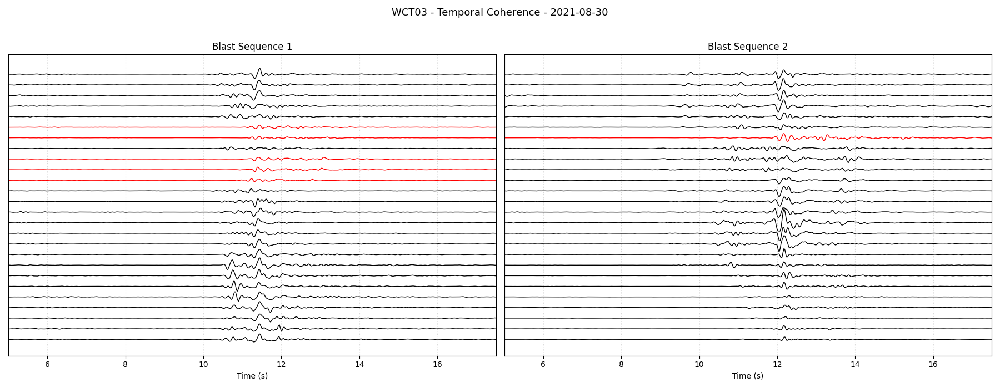

In [274]:
# Get data for one day
day = "2021-08-30"
wf = by_day[day]

plot_waveforms_split(wf, fs, day, "WCT", 3, xlim=[5,17.5], trace_spacing=0.95, highlight_phase_shift=True, outpath="Figures/Temporal_Coherence/WCT_2021_08_30_Waveforms.png")

In [178]:
# Looking at 1 day
# Build equal-length stack for xcorr_matrix_temporal
# Trim 5s, then truncate all to the minimum remaining length
trimmed = [wf[trim_n:-trim_n] for wf in wfs if len(wf) > 2*trim_n]
L = min(len(wf) for wf in trimmed)
data_tmp = np.stack([wf[:L] for wf in trimmed], axis=0)  # shape (N, L)
t = np.arange(L) / fs                                   # shape (L,)

# Compute correlation matrix with YOUR function
xcorr_coef, lag_tshifts, ref = mcaap.xcorr_matrix_temporal(t, data_tmp)
# Save waveform stack figure
n_kept = plot_waveform_stack(lag_tshifts, ref, day, array_prefix, element_num, wfs, fs, save_dir)
if n_kept < 2:
    # Not enough valid traces after trimming
    continue

# Save correlation-matrix figure
title = f"{array_prefix}{element_num:02d} — {day}"
outpath = save_dir_xcorr / f"{array_prefix}{element_num:02d}_{day}_corr_matrix.png"
# If you want the Area2/Area1 divider, set split_idx=26 (or None to skip)
plot_corr_matrix_pmesh(xcorr_coef, title, outpath, split_idx=26)

(array([37]),)

## Winter 2021
---
#### MCA - 2021/02/05

<IPython.core.display.Javascript object>


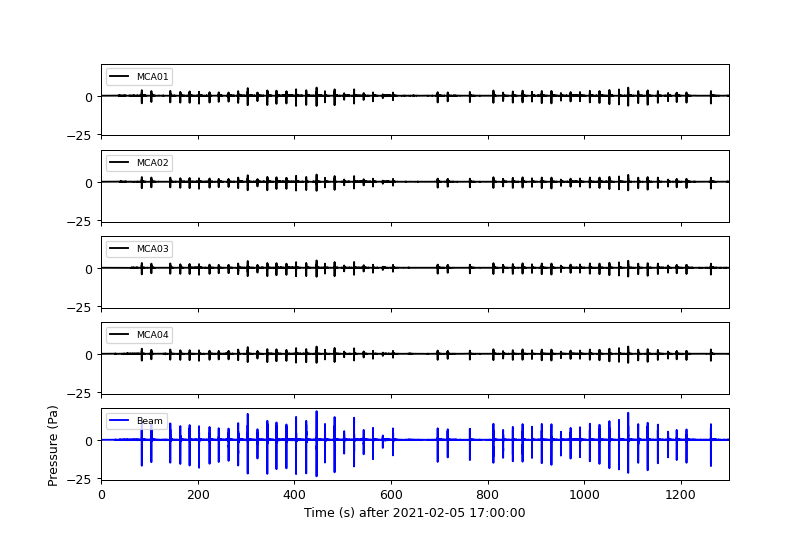

In [48]:
%matplotlib notebook
t_beam, st_beam = mcaap.get_beam_for_xcorr(winter_data_dir, array='MCA', julian_day=36, xlim=[0,1300])

In [49]:
%%time
t_data, MCA_data = mcaap.get_signals_from_beam(t_beam, st_beam, data_dir=winter_data_dir, filepath='MCA_Detections/Signal_Times_CWT/MCA01_BDF/36.npy', time_to_start=1, time_to_end=2)
MCA_data.shape

CPU times: user 12.1 ms, sys: 4.3 ms, total: 16.4 ms
Wall time: 14.2 ms


(51, 300)

In [50]:
%%time
# Cross-correlate
xcorr_coef, lag_tshifts, ref = mcaap.xcorr_matrix_temporal(t_data, MCA_data)

CPU times: user 344 ms, sys: 6.7 ms, total: 351 ms
Wall time: 348 ms


<IPython.core.display.Javascript object>


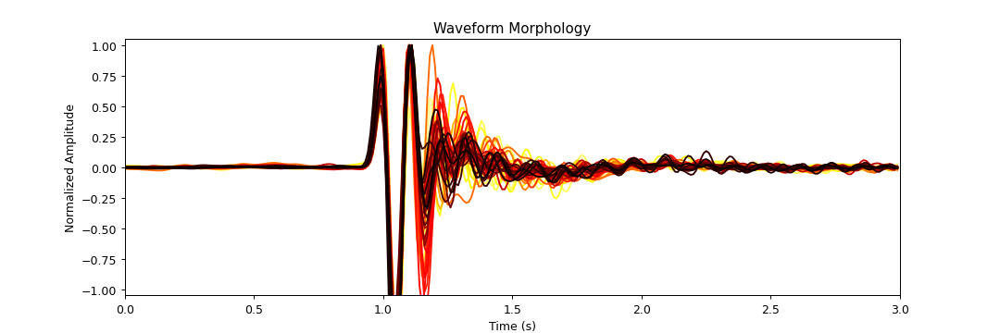

In [51]:
%matplotlib notebook
mdir = winter_data_dir + 'MCA_Detections'; datadir = mdir + '/Waveform_Morphology'; outfigdir = datadir + '/Waveform_Morphology'
stream = mcaap.plot_LagShifts(st_beam, t_data, MCA_data, lag_tshifts, ref, mdir, datadir, outfigdir, name_of_array = 'MCA')

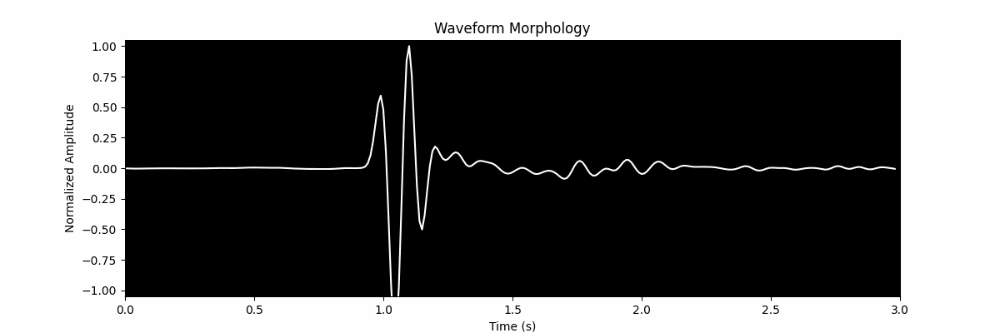

In [52]:
from IPython.display import Image as IPython_Image
IPython_Image(stream)

<IPython.core.display.Javascript object>


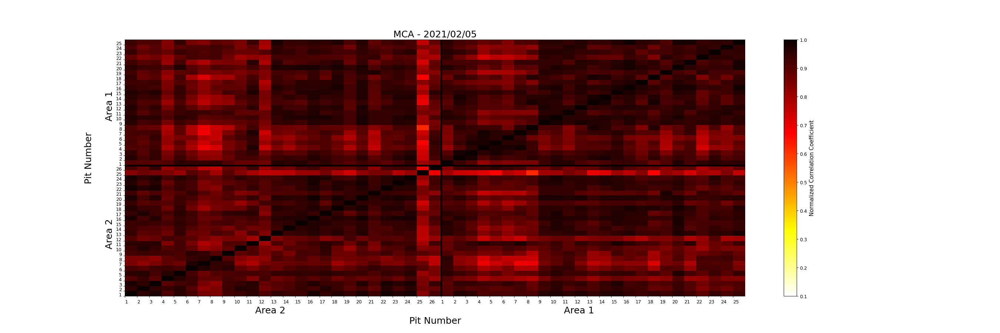

Text(0.5, 1.0, 'MCA - 2021/02/05')

In [53]:
%matplotlib notebook 
pits1 = np.arange(1,27,1); pits2 = np.arange(1,26,1)
pits = np.concatenate((pits1,pits2))
mcaap.plot_XcorrMatrix(st_beam, xcorr_coef, name_of_array='MCA', pit_number = np.array(pits), vmin=0.1)

area1_str = 'Area 2'; area2_str = 'Area 1'; pit_str = 'Pit Number'

plt.xlabel(area1_str.rjust(50) + area2_str.rjust(100) + '\n' + pit_str.rjust(106), fontsize=20, loc='left')
plt.ylabel(pit_str.rjust(48) + '\n\n' + area1_str.rjust(22) + area2_str.rjust(39) , fontsize=20, loc='bottom')

plt.axvline(x=len(np.array(pits1)), linewidth=4, color='k')
plt.axhline(y=len(np.array(pits1)), linewidth=4, color='k')
plt.title('MCA - 2021/02/05', fontsize=20)

---
#### EOCR - 2021/02/05

<IPython.core.display.Javascript object>


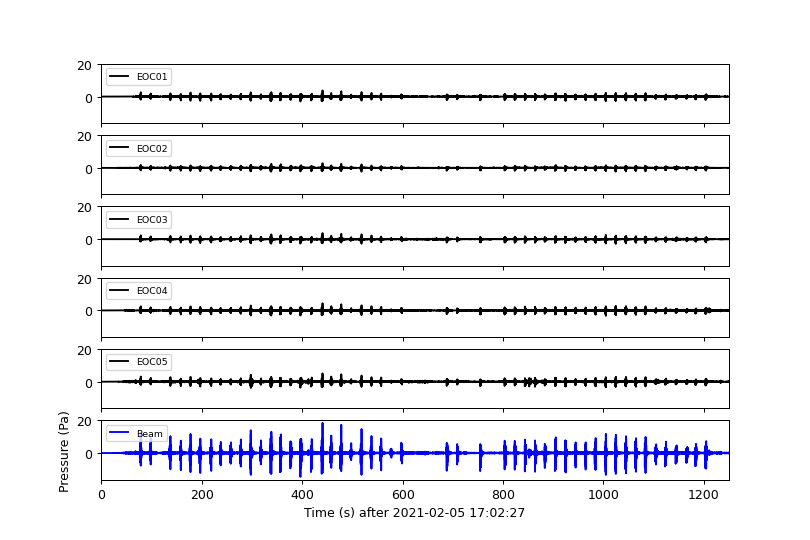

In [54]:
%matplotlib notebook
t_beam, st_beam = mcaap.get_beam_for_xcorr(winter_data_dir, array='EOCR', julian_day=36, xlim=[0,1250])

In [55]:
%%time
t_data, EOCR_data = mcaap.get_signals_from_beam(t_beam, st_beam, data_dir=winter_data_dir, filepath='EOCR_Detections/Signal_Times/36.csv', time_to_start=5, time_to_end=2)
EOCR_data.shape

CPU times: user 10.7 ms, sys: 5.77 ms, total: 16.5 ms
Wall time: 13.6 ms


(51, 280)

In [56]:
%%time
# Cross-correlate
xcorr_coef, lag_tshifts, ref = mcaap.xcorr_matrix_temporal(t_data, EOCR_data)

CPU times: user 330 ms, sys: 7.5 ms, total: 338 ms
Wall time: 336 ms


<IPython.core.display.Javascript object>


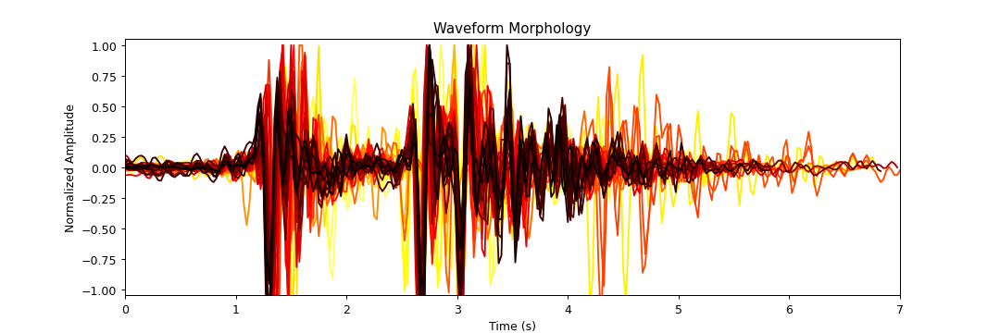

In [57]:
%matplotlib notebook
mdir = winter_data_dir + 'EOCR_Detections'; datadir = mdir + '/Waveform_Morphology'; outfigdir = datadir + '/Waveform_Morphology'
stream = mcaap.plot_LagShifts(st_beam, t_data, EOCR_data, lag_tshifts, ref, mdir, datadir, outfigdir, name_of_array = 'EOCR')

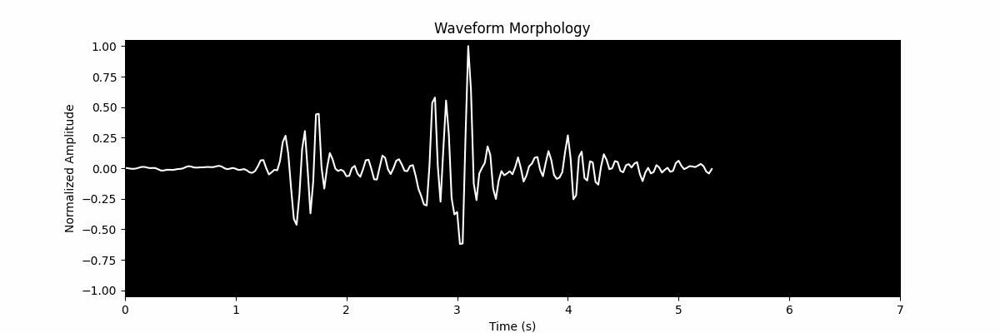

In [58]:
from IPython.display import Image as IPython_Image
IPython_Image(stream)

<IPython.core.display.Javascript object>


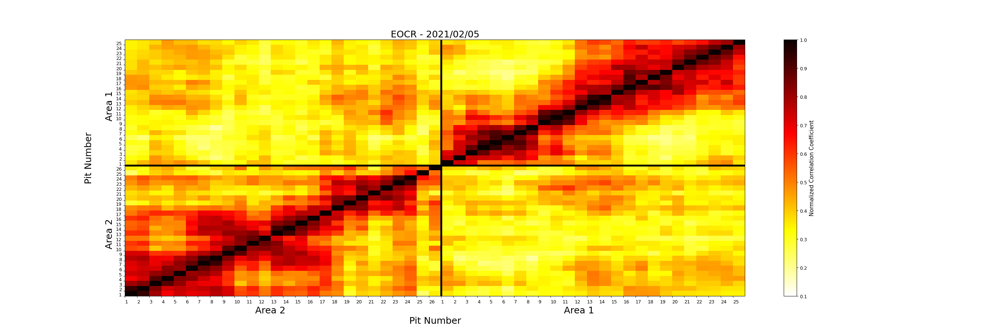

Text(0.5, 1.0, 'EOCR - 2021/02/05')

In [59]:
%matplotlib notebook 
pits1 = np.arange(1,27,1); pits2 = np.arange(1,26,1)
pits = np.concatenate((pits1,pits2))
mcaap.plot_XcorrMatrix(st_beam, xcorr_coef, name_of_array='EOCR', pit_number = np.array(pits), vmin=0.1)

area1_str = 'Area 2'; area2_str = 'Area 1'; pit_str = 'Pit Number'

plt.xlabel(area1_str.rjust(50) + area2_str.rjust(100) + '\n' + pit_str.rjust(106), fontsize=20, loc='left')
plt.ylabel(pit_str.rjust(48) + '\n\n' + area1_str.rjust(22) + area2_str.rjust(39) , fontsize=20, loc='bottom')

plt.axvline(x=len(np.array(pits1)), linewidth=4, color='k')
plt.axhline(y=len(np.array(pits1)), linewidth=4, color='k')
plt.title('EOCR - 2021/02/05', fontsize=20)

---
#### EOCL - 2021/02/05

<IPython.core.display.Javascript object>


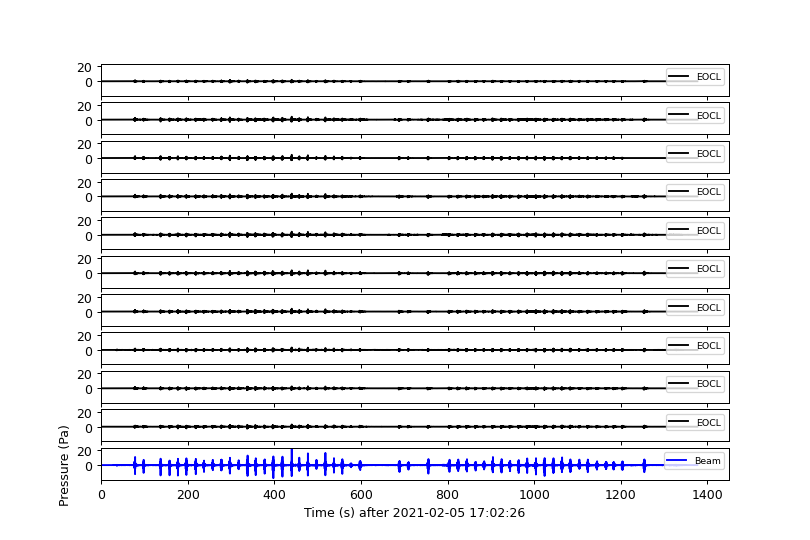

In [60]:
%matplotlib notebook
t_beam, st_beam = mcaap.get_beam_for_xcorr(winter_data_dir, array='EOCL', julian_day=36, xlim=[0,1450], legend_loc='upper right')

In [61]:
%%time
t_data, EOCL_data = mcaap.get_signals_from_beam(t_beam, st_beam, data_dir=winter_data_dir, filepath='EOCL_Detections/Signal_Times/36.csv', time_to_start=4, time_to_end=3)
EOCL_data.shape

CPU times: user 10 ms, sys: 6.01 ms, total: 16 ms
Wall time: 12.6 ms


(51, 280)

In [62]:
%%time
# Cross-correlate
xcorr_coef, lag_tshifts, ref = mcaap.xcorr_matrix_temporal(t_data, EOCL_data)

CPU times: user 328 ms, sys: 6.91 ms, total: 335 ms
Wall time: 332 ms


<IPython.core.display.Javascript object>


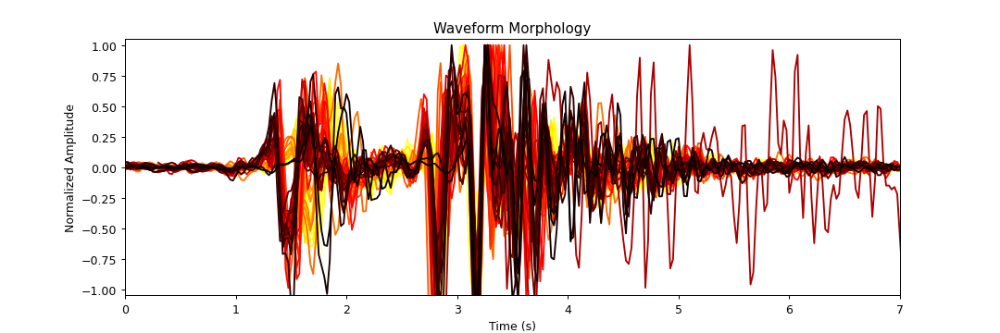

In [63]:
%matplotlib notebook
mdir = winter_data_dir + 'EOCL_Detections'; datadir = mdir + '/Waveform_Morphology'; outfigdir = datadir + '/Waveform_Morphology'
stream = mcaap.plot_LagShifts(st_beam, t_data, EOCL_data, lag_tshifts, ref, mdir, datadir, outfigdir, name_of_array = 'EOCL')

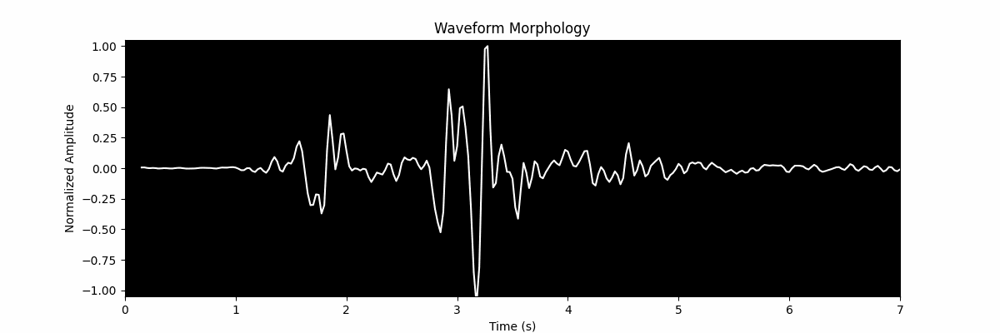

In [64]:
from IPython.display import Image as IPython_Image
IPython_Image(stream)

<IPython.core.display.Javascript object>


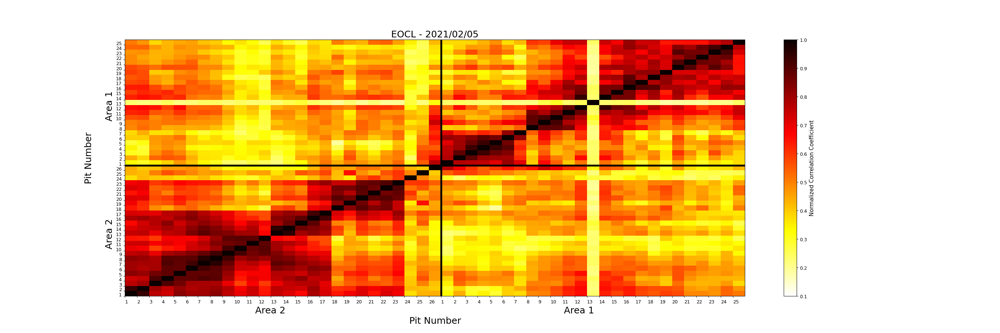

Text(0.5, 1.0, 'EOCL - 2021/02/05')

In [65]:
%matplotlib notebook 
pits1 = np.arange(1,27,1); pits2 = np.arange(1,26,1)
pits = np.concatenate((pits1,pits2))
mcaap.plot_XcorrMatrix(st_beam, xcorr_coef, name_of_array='EOCL', pit_number = np.array(pits), vmin=0.1)

area1_str = 'Area 2'; area2_str = 'Area 1'; pit_str = 'Pit Number'

plt.xlabel(area1_str.rjust(50) + area2_str.rjust(100) + '\n' + pit_str.rjust(106), fontsize=20, loc='left')
plt.ylabel(pit_str.rjust(48) + '\n\n' + area1_str.rjust(22) + area2_str.rjust(39) , fontsize=20, loc='bottom')

plt.axvline(x=len(np.array(pits1)), linewidth=4, color='k')
plt.axhline(y=len(np.array(pits1)), linewidth=4, color='k')
plt.title('EOCL - 2021/02/05', fontsize=20)

## Summer 2021
---
#### MCB - 2021/07/21

<IPython.core.display.Javascript object>


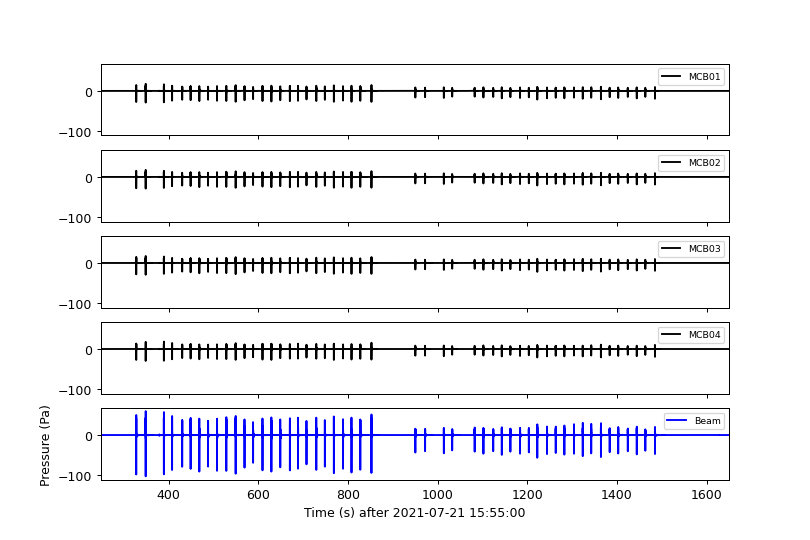

In [68]:
%matplotlib notebook
t_beam, st_beam = mcaap.get_beam_for_xcorr(summer_data_dir, array='MCB', julian_day=202, xlim=[250,1650], legend_loc='upper right')

In [77]:
%%time
t_data, MCB_data = mcaap.get_signals_from_beam(t_beam, st_beam, data_dir=summer_data_dir, filepath='MCB_Detections/Signal_Times_CWT/MCB01_BDF/202.npy', time_to_start=1, time_to_end=2)
MCB_data.shape

CPU times: user 4.24 ms, sys: 1.25 ms, total: 5.49 ms
Wall time: 4.63 ms


(51, 300)

In [78]:
%%time
# Cross-correlate
xcorr_coef, lag_tshifts, ref = mcaap.xcorr_matrix_temporal(t_data, MCB_data)

CPU times: user 326 ms, sys: 1.84 ms, total: 328 ms
Wall time: 328 ms


<IPython.core.display.Javascript object>


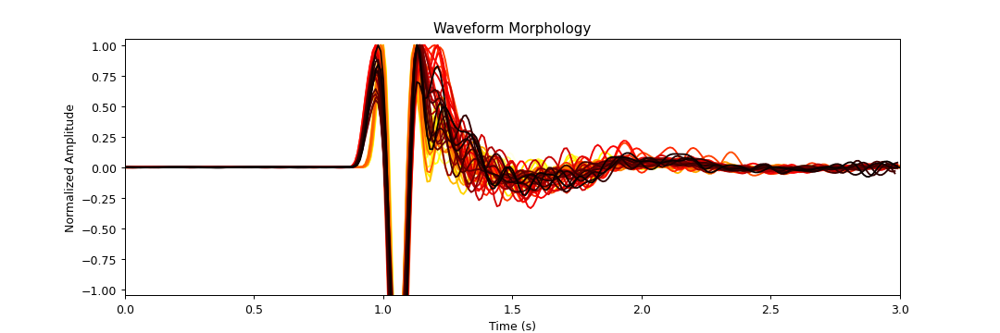

In [79]:
%matplotlib notebook
mdir = summer_data_dir + 'MCB_Detections'; datadir = mdir + '/Waveform_Morphology'; outfigdir = datadir + '/Waveform_Morphology'
stream = mcaap.plot_LagShifts(st_beam, t_data, MCB_data, lag_tshifts, ref, mdir, datadir, outfigdir, name_of_array = 'MCB')

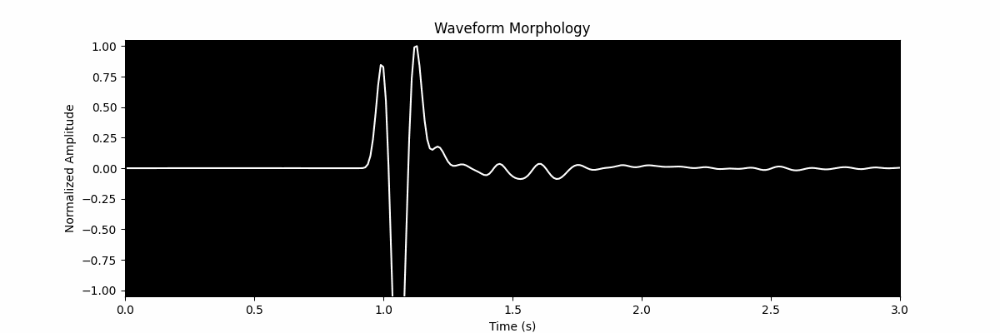

In [80]:
from IPython.display import Image as IPython_Image
IPython_Image(stream)

<IPython.core.display.Javascript object>


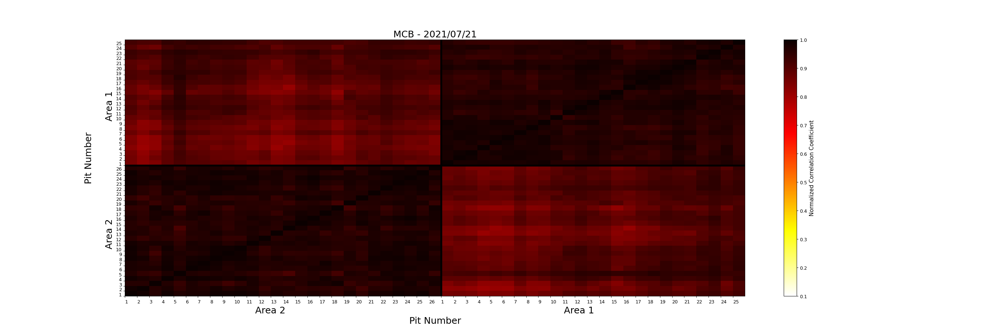

Text(0.5, 1.0, 'MCB - 2021/07/21')

In [81]:
%matplotlib notebook 
pits1 = np.arange(1,27,1); pits2 = np.arange(1,26,1)
pits = np.concatenate((pits1,pits2))
mcaap.plot_XcorrMatrix(st_beam, xcorr_coef, name_of_array='MCB', pit_number = np.array(pits), vmin=0.1)

area1_str = 'Area 2'; area2_str = 'Area 1'; pit_str = 'Pit Number'

plt.xlabel(area1_str.rjust(50) + area2_str.rjust(100) + '\n' + pit_str.rjust(106), fontsize=20, loc='left')
plt.ylabel(pit_str.rjust(48) + '\n\n' + area1_str.rjust(22) + area2_str.rjust(39) , fontsize=20, loc='bottom')

plt.axvline(x=len(np.array(pits1)), linewidth=4, color='k')
plt.axhline(y=len(np.array(pits1)), linewidth=4, color='k')
plt.title('MCB - 2021/07/21', fontsize=20)

---
#### WCT - 2021/07/21

<IPython.core.display.Javascript object>


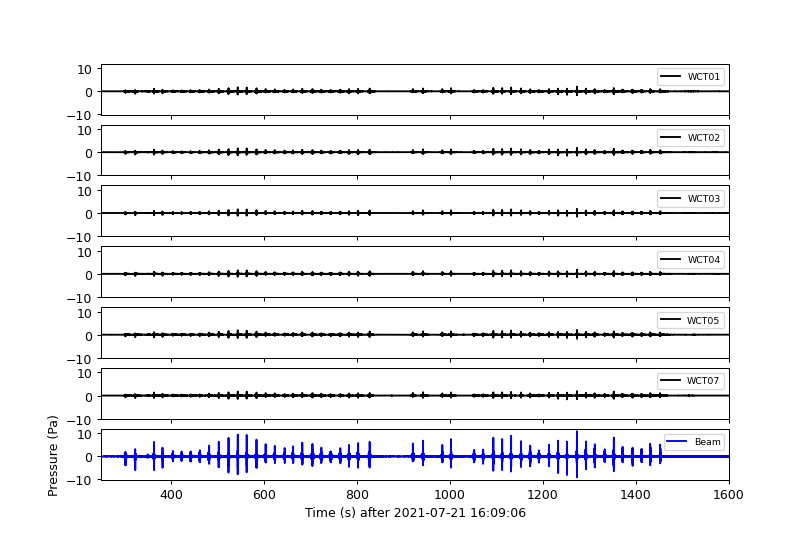

In [125]:
%matplotlib notebook
t_beam, st_beam = mcaap.get_beam_for_xcorr(summer_data_dir, array='WCT', julian_day=202, xlim=[250,1600], legend_loc='upper right')

In [126]:
%%time
t_data, WCT_data = mcaap.get_signals_from_beam(t_beam, st_beam, data_dir=summer_data_dir, filepath='WCT_Detections/Beamform_Signal_Times_CWT/WCT_Beam/202.npy', time_to_start=15, time_to_end=15)
WCT_data.shape

CPU times: user 2.88 ms, sys: 1.65 ms, total: 4.54 ms
Wall time: 4.48 ms


(51, 1200)

In [127]:
%%time
# Cross-correlate
xcorr_coef, lag_tshifts, ref = mcaap.xcorr_matrix_temporal(t_data, WCT_data)

CPU times: user 3.2 s, sys: 8.53 ms, total: 3.21 s
Wall time: 3.21 s


<IPython.core.display.Javascript object>


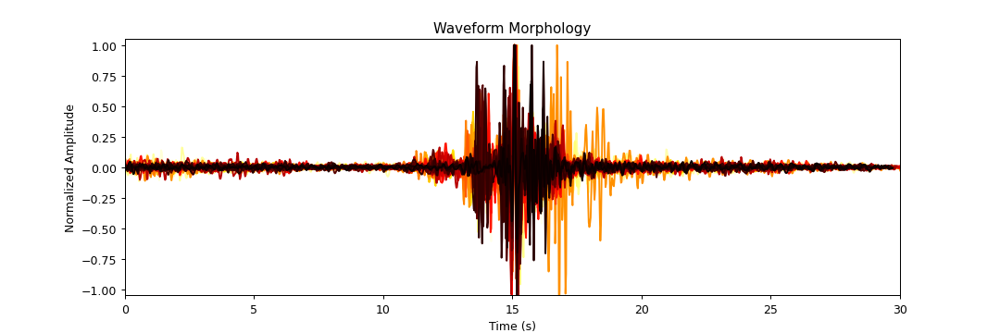

In [128]:
%matplotlib notebook
mdir = summer_data_dir + 'WCT_Detections'; datadir = mdir + '/Waveform_Morphology'; outfigdir = datadir + '/Waveform_Morphology'
stream = mcaap.plot_LagShifts(st_beam, t_data, WCT_data, lag_tshifts, ref, mdir, datadir, outfigdir, name_of_array = 'WCT')

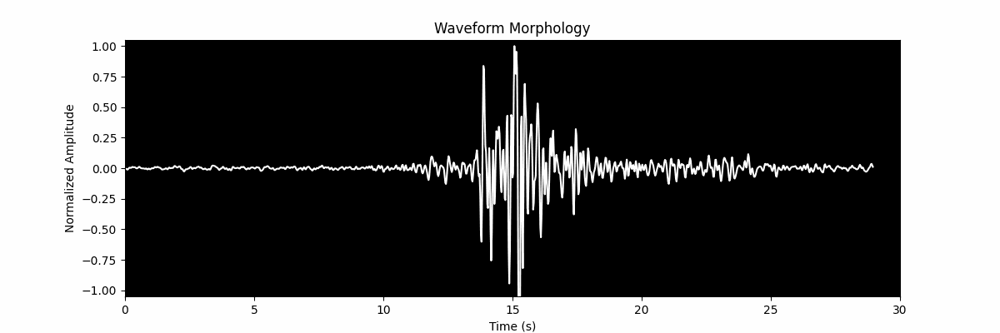

In [129]:
from IPython.display import Image as IPython_Image
IPython_Image(stream)

<IPython.core.display.Javascript object>


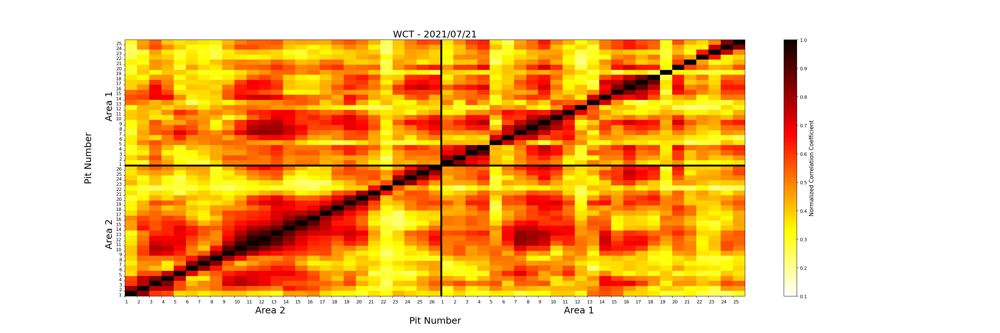

Text(0.5, 1.0, 'WCT - 2021/07/21')

In [130]:
%matplotlib notebook 
pits1 = np.arange(1,27,1); pits2 = np.arange(1,26,1)
pits = np.concatenate((pits1,pits2))
mcaap.plot_XcorrMatrix(st_beam, xcorr_coef, name_of_array='WCT', pit_number = np.array(pits), vmin=0.1)

area1_str = 'Area 2'; area2_str = 'Area 1'; pit_str = 'Pit Number'

plt.xlabel(area1_str.rjust(50) + area2_str.rjust(100) + '\n' + pit_str.rjust(106), fontsize=20, loc='left')
plt.ylabel(pit_str.rjust(48) + '\n\n' + area1_str.rjust(22) + area2_str.rjust(39) , fontsize=20, loc='bottom')

plt.axvline(x=len(np.array(pits1)), linewidth=4, color='k')
plt.axhline(y=len(np.array(pits1)), linewidth=4, color='k')
plt.title('WCT - 2021/07/21', fontsize=20)